## Configuración inicial

A continuación se importan las librerías necesarias para el funcionamiento del notebook. 

In [1]:
#plots and data
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

#metrics and transformations
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn import metrics

#Model 
import xgboost as xgb

sns.set()

In [3]:
#function to measure the performance
def timeseries_evaluation_metrics_func(y_true, y_pred,flag):
    def mean_absolute_percentage_error(y_true, y_pred): 
        epsilon=0.1e-5
        y_true, y_pred = np.array(y_true), np.array(y_pred)
        return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    
    if flag : print(f'R2 is : {metrics.r2_score(y_true, y_pred)}',end='\n\n')
    else:
        print('Evaluation metric results:')
        print(f'MSE is : {metrics.mean_squared_error(y_true, y_pred)}')
        print(f'MAE is : {metrics.mean_absolute_error(y_true, y_pred)}')
        print(f'RMSE is : {np.sqrt(metrics.mean_squared_error(y_true, y_pred))}')
        print(f'MAPE is : {mean_absolute_percentage_error(y_true, y_pred)}')
        
    return {"MSE":metrics.mean_squared_error(y_true, y_pred),
           "MAE":metrics.mean_absolute_error(y_true, y_pred),
           "RMSE":np.sqrt(metrics.mean_squared_error(y_true, y_pred)),
           "MAPE":mean_absolute_percentage_error(y_true, y_pred)}

In [4]:
def plot_predict_test(df_test_y,testPredict,lag):
        ### Resultado predicción datos de entrenamiento
    fig, ax = plt.subplots(figsize=[15,8])
    sns.lineplot(df_test_y.flatten(),label="real")
    sns.lineplot(testPredict.flatten(),label="predicción")
    plt.title("Comparación valor real y predicción")
    plt.ylabel("value")

In [5]:
def createLagFeature(name_features,lag,df):
    for name_feature in name_features:
        for i in range(1,lag+1):
            df[name_feature+"lag"+str(i)]=df[name_feature].shift(i)
    return df

---

## Cargar y preparar los datos.

In [2]:
df = pd.read_csv("../../Datasets/Datos_durante_pandemia/data_durante_vol_ve_ic.csv")

df['Fecha'] = pd.to_datetime(df['Fecha'])
df = df.sort_values('Fecha', ascending=True)
df = df.rename(columns = {'Vol. Futuros': 'VolFuturos'})
df

,Fecha,VolFuturos,TRM,Precio Interno,PI,MHI,FNI,SI
0,2020-01-01,1.289946,3277.14,975000.0,0.00,0.00,0.00,0.00
1,2020-01-02,0.735046,3277.14,945000.0,0.00,0.00,0.00,0.00
2,2020-01-03,0.591834,3258.84,940000.0,0.00,0.00,0.00,0.00
3,2020-01-04,1.367154,3262.05,930000.0,0.00,0.00,0.00,0.00
4,2020-01-05,1.505321,3262.05,920000.0,0.00,0.00,0.00,0.00
...,...,...,...,...,...,...,...,...
913,2022-07-02,0.778572,4198.77,2270000.0,4.66,25.71,0.19,-3.56
914,2022-07-03,0.819483,4198.77,2270000.0,0.42,7.76,0.00,-3.67
915,2022-07-04,0.843804,4198.77,2270000.0,0.54,31.37,0.27,-5.85
916,2022-07-05,0.850985,4198.77,2280000.0,0.48,38.21,0.12,-4.97


---

## Desarrollo del modelo

In [7]:
#objects to scale the data 
sc=StandardScaler()
sc2=StandardScaler()

In [8]:
df_stats=df

In [9]:
#
len_data=df_stats.shape[0]

#get target
df_label=df_stats["VolFuturos"].values.reshape(len_data,1)
#get attributes
df_data=df_stats.drop(columns=["Fecha"])

#apply scale
#df_label=sc.fit_transform(df_label)
#df_data_normalize=sc2.fit_transform(df_data)


In [10]:
def Model(df_data,df_label,lag,estimators):
    delete_columns=list(df_data.columns)
    df_data_lags=createLagFeature(df_data.columns,lag,df_data) if lag>0 else df_data
    df_data_lags.drop(columns=delete_columns,inplace=True)
    df_data_lags=df_data_lags[lag:]
    #transform data
    df_data_lags=sc2.fit_transform(df_data_lags)
    
    #split data
    #last index of the train data
    seventy_percent=int(len_data*0.7)

    #split the data normalize
    df_train=df_data_lags[:seventy_percent]
    df_test=df_data_lags[seventy_percent:]

    #split labels
    df_label=df_label[lag:]
    df_train_y=df_label[:seventy_percent]
    df_test_y=df_label[seventy_percent:]
    #split labels normalize
    df_label_normalize=sc.fit_transform(df_label)
    df_train_y_normalize=df_label_normalize[:seventy_percent]
    df_test_y_normalize=df_label_normalize[seventy_percent:]
    
   
    #make model
    model=xgb.XGBRegressor(n_estimators=estimators
                        ,early_stopping_rounds=80)
    #fit the model with the train data
    
    history=model.fit(df_train,df_train_y_normalize,
          eval_set=[(df_train,df_train_y_normalize),(df_test,df_test_y_normalize)])
   
    # make predictions
    trainPredict = model.predict(df_train)
    trainPredict = np.reshape(trainPredict,(len(trainPredict),1))
    # invert transformation
    trainPredict = sc.inverse_transform(trainPredict)
    trainY = df_train_y
    
    # make predictions
    testPredict = model.predict(df_test)
    # invert transformation
    testPredict = np.reshape(testPredict,(len(testPredict),1))
    testPredict = sc.inverse_transform(testPredict)
    testY = df_test_y
    print("len test: ",testY.shape)
    print("len PREDICT: ",testPredict.shape)
    
    plot_predict_test(df_train_y,trainPredict,lag)
    plot_predict_test(df_test_y,testPredict,lag)
    return [{"Fecha":df_stats.Fecha[lag:][:seventy_percent],"typeXGBoost":["train"]*len(trainPredict.flatten()),"XGBoost" :trainPredict.flatten()}
            ,{"Fecha":df_stats.Fecha[lag:][seventy_percent:],"typeXGBoost":["test"]*len(testPredict.flatten()),"XGBoost":testPredict.flatten()}]
   
    return {"train":timeseries_evaluation_metrics_func(trainY.flatten()+1, trainPredict.flatten()+1,False),
           "test":timeseries_evaluation_metrics_func(testY.flatten()+1, testPredict.flatten()+1,False)}

## Resultados

[0]	validation_0-rmse:0.98410	validation_1-rmse:1.40939
[1]	validation_0-rmse:0.87646	validation_1-rmse:1.82242
[2]	validation_0-rmse:0.80296	validation_1-rmse:1.98936
[3]	validation_0-rmse:0.75091	validation_1-rmse:2.12736
[4]	validation_0-rmse:0.66984	validation_1-rmse:2.11438
[5]	validation_0-rmse:0.62469	validation_1-rmse:2.21228
[6]	validation_0-rmse:0.57391	validation_1-rmse:2.21245
[7]	validation_0-rmse:0.53186	validation_1-rmse:2.19654
[8]	validation_0-rmse:0.50407	validation_1-rmse:2.26768
[9]	validation_0-rmse:0.45407	validation_1-rmse:2.26311
[10]	validation_0-rmse:0.43093	validation_1-rmse:2.27274
[11]	validation_0-rmse:0.41201	validation_1-rmse:2.27212
[12]	validation_0-rmse:0.37338	validation_1-rmse:2.27598
[13]	validation_0-rmse:0.35480	validation_1-rmse:2.26013
[14]	validation_0-rmse:0.34642	validation_1-rmse:2.26155
[15]	validation_0-rmse:0.32834	validation_1-rmse:2.26213
[16]	validation_0-rmse:0.32329	validation_1-rmse:2.24895
[17]	validation_0-rmse:0.31100	validation

[23]	validation_0-rmse:0.23144	validation_1-rmse:2.26226
[24]	validation_0-rmse:0.21604	validation_1-rmse:2.27176
[25]	validation_0-rmse:0.20403	validation_1-rmse:2.27862
[26]	validation_0-rmse:0.19596	validation_1-rmse:2.28564
[27]	validation_0-rmse:0.18718	validation_1-rmse:2.28134
[28]	validation_0-rmse:0.18097	validation_1-rmse:2.28512
[29]	validation_0-rmse:0.17064	validation_1-rmse:2.27956
[30]	validation_0-rmse:0.16612	validation_1-rmse:2.27842
[31]	validation_0-rmse:0.16238	validation_1-rmse:2.27751
[32]	validation_0-rmse:0.14963	validation_1-rmse:2.27863
[33]	validation_0-rmse:0.14576	validation_1-rmse:2.27821
[34]	validation_0-rmse:0.14113	validation_1-rmse:2.27579
[35]	validation_0-rmse:0.13039	validation_1-rmse:2.27701
[36]	validation_0-rmse:0.12891	validation_1-rmse:2.27586
[37]	validation_0-rmse:0.12509	validation_1-rmse:2.27616
[38]	validation_0-rmse:0.11676	validation_1-rmse:2.27450
[39]	validation_0-rmse:0.11359	validation_1-rmse:2.28951
[40]	validation_0-rmse:0.10644	

[6]	validation_0-rmse:0.57391	validation_1-rmse:2.21245
[7]	validation_0-rmse:0.53186	validation_1-rmse:2.19654
[8]	validation_0-rmse:0.50407	validation_1-rmse:2.26768
[9]	validation_0-rmse:0.45407	validation_1-rmse:2.26311
[10]	validation_0-rmse:0.43093	validation_1-rmse:2.27274
[11]	validation_0-rmse:0.41201	validation_1-rmse:2.27212
[12]	validation_0-rmse:0.37338	validation_1-rmse:2.27598
[13]	validation_0-rmse:0.35480	validation_1-rmse:2.26013
[14]	validation_0-rmse:0.34642	validation_1-rmse:2.26155
[15]	validation_0-rmse:0.32834	validation_1-rmse:2.26213
[16]	validation_0-rmse:0.32329	validation_1-rmse:2.24895
[17]	validation_0-rmse:0.31100	validation_1-rmse:2.23868
[18]	validation_0-rmse:0.29650	validation_1-rmse:2.23936
[19]	validation_0-rmse:0.27844	validation_1-rmse:2.25277
[20]	validation_0-rmse:0.25909	validation_1-rmse:2.26339
[21]	validation_0-rmse:0.25496	validation_1-rmse:2.26209
[22]	validation_0-rmse:0.24243	validation_1-rmse:2.26492
[23]	validation_0-rmse:0.23144	vali

[65]	validation_0-rmse:0.03369	validation_1-rmse:2.28699
[66]	validation_0-rmse:0.03173	validation_1-rmse:2.28689
[67]	validation_0-rmse:0.03130	validation_1-rmse:2.28650
[68]	validation_0-rmse:0.03056	validation_1-rmse:2.28690
[69]	validation_0-rmse:0.02816	validation_1-rmse:2.28721
[70]	validation_0-rmse:0.02602	validation_1-rmse:2.28744
[71]	validation_0-rmse:0.02447	validation_1-rmse:2.28808
[72]	validation_0-rmse:0.02219	validation_1-rmse:2.28873
[73]	validation_0-rmse:0.02190	validation_1-rmse:2.28818
[74]	validation_0-rmse:0.02103	validation_1-rmse:2.28791
[75]	validation_0-rmse:0.02014	validation_1-rmse:2.28872
[76]	validation_0-rmse:0.01980	validation_1-rmse:2.28877
[77]	validation_0-rmse:0.01811	validation_1-rmse:2.28946
[78]	validation_0-rmse:0.01731	validation_1-rmse:2.28976
[79]	validation_0-rmse:0.01635	validation_1-rmse:2.28941
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 1.512698306699878
MAE is : 1.0033441987543512
RMSE is : 1.22991800

[38]	validation_0-rmse:0.11676	validation_1-rmse:2.27450
[39]	validation_0-rmse:0.11359	validation_1-rmse:2.28951
[40]	validation_0-rmse:0.10644	validation_1-rmse:2.28949
[41]	validation_0-rmse:0.09818	validation_1-rmse:2.28659
[42]	validation_0-rmse:0.09648	validation_1-rmse:2.28748
[43]	validation_0-rmse:0.09003	validation_1-rmse:2.28704
[44]	validation_0-rmse:0.08798	validation_1-rmse:2.28700
[45]	validation_0-rmse:0.08593	validation_1-rmse:2.29184
[46]	validation_0-rmse:0.07887	validation_1-rmse:2.28809
[47]	validation_0-rmse:0.07778	validation_1-rmse:2.28781
[48]	validation_0-rmse:0.07386	validation_1-rmse:2.28954
[49]	validation_0-rmse:0.06823	validation_1-rmse:2.28925
[50]	validation_0-rmse:0.06702	validation_1-rmse:2.28786
[51]	validation_0-rmse:0.06433	validation_1-rmse:2.28771
[52]	validation_0-rmse:0.06023	validation_1-rmse:2.28789
[53]	validation_0-rmse:0.05751	validation_1-rmse:2.28831
[54]	validation_0-rmse:0.05441	validation_1-rmse:2.28802
[55]	validation_0-rmse:0.05133	

[41]	validation_0-rmse:0.06748	validation_1-rmse:2.83751
[42]	validation_0-rmse:0.06193	validation_1-rmse:2.84009
[43]	validation_0-rmse:0.06026	validation_1-rmse:2.84069
[44]	validation_0-rmse:0.05721	validation_1-rmse:2.84032
[45]	validation_0-rmse:0.05481	validation_1-rmse:2.84117
[46]	validation_0-rmse:0.05192	validation_1-rmse:2.84108
[47]	validation_0-rmse:0.04863	validation_1-rmse:2.83987
[48]	validation_0-rmse:0.04692	validation_1-rmse:2.84010
[49]	validation_0-rmse:0.04295	validation_1-rmse:2.84160
[50]	validation_0-rmse:0.04139	validation_1-rmse:2.84020
[51]	validation_0-rmse:0.03913	validation_1-rmse:2.83898
[52]	validation_0-rmse:0.03651	validation_1-rmse:2.83908
[53]	validation_0-rmse:0.03548	validation_1-rmse:2.83867
[54]	validation_0-rmse:0.03316	validation_1-rmse:2.83935
[55]	validation_0-rmse:0.03201	validation_1-rmse:2.83945
[56]	validation_0-rmse:0.03034	validation_1-rmse:2.83861
[57]	validation_0-rmse:0.02840	validation_1-rmse:2.83958
[58]	validation_0-rmse:0.02564	

<ipython-input-4-f7487097fa4e>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=[15,8])


[0]	validation_0-rmse:0.98346	validation_1-rmse:1.41628
[1]	validation_0-rmse:0.86920	validation_1-rmse:1.82563
[2]	validation_0-rmse:0.79503	validation_1-rmse:2.29205
[3]	validation_0-rmse:0.74551	validation_1-rmse:2.72702
[4]	validation_0-rmse:0.67539	validation_1-rmse:2.69450
[5]	validation_0-rmse:0.63621	validation_1-rmse:2.93164
[6]	validation_0-rmse:0.59077	validation_1-rmse:2.92843
[7]	validation_0-rmse:0.55012	validation_1-rmse:2.90945
[8]	validation_0-rmse:0.50873	validation_1-rmse:2.89894
[9]	validation_0-rmse:0.47573	validation_1-rmse:2.88919
[10]	validation_0-rmse:0.43263	validation_1-rmse:2.90249
[11]	validation_0-rmse:0.38837	validation_1-rmse:2.89264
[12]	validation_0-rmse:0.37666	validation_1-rmse:2.88225
[13]	validation_0-rmse:0.35427	validation_1-rmse:2.88674
[14]	validation_0-rmse:0.33905	validation_1-rmse:2.88829
[15]	validation_0-rmse:0.32355	validation_1-rmse:2.88063
[16]	validation_0-rmse:0.31321	validation_1-rmse:2.89140
[17]	validation_0-rmse:0.30046	validation

[59]	validation_0-rmse:0.02527	validation_1-rmse:2.84175
[60]	validation_0-rmse:0.02391	validation_1-rmse:2.84259
[61]	validation_0-rmse:0.02341	validation_1-rmse:2.84255
[62]	validation_0-rmse:0.02231	validation_1-rmse:2.84130
[63]	validation_0-rmse:0.02132	validation_1-rmse:2.84054
[64]	validation_0-rmse:0.02088	validation_1-rmse:2.84026
[65]	validation_0-rmse:0.01907	validation_1-rmse:2.83864
[66]	validation_0-rmse:0.01869	validation_1-rmse:2.83933
[67]	validation_0-rmse:0.01767	validation_1-rmse:2.83961
[68]	validation_0-rmse:0.01705	validation_1-rmse:2.83965
[69]	validation_0-rmse:0.01646	validation_1-rmse:2.83952
[70]	validation_0-rmse:0.01540	validation_1-rmse:2.83957
[71]	validation_0-rmse:0.01492	validation_1-rmse:2.83964
[72]	validation_0-rmse:0.01437	validation_1-rmse:2.83872
[73]	validation_0-rmse:0.01373	validation_1-rmse:2.83784
[74]	validation_0-rmse:0.01312	validation_1-rmse:2.83797
[75]	validation_0-rmse:0.01246	validation_1-rmse:2.83817
[76]	validation_0-rmse:0.01206	

[31]	validation_0-rmse:0.12750	validation_1-rmse:2.84004
[32]	validation_0-rmse:0.11677	validation_1-rmse:2.83638
[33]	validation_0-rmse:0.11082	validation_1-rmse:2.83654
[34]	validation_0-rmse:0.09947	validation_1-rmse:2.83713
[35]	validation_0-rmse:0.09547	validation_1-rmse:2.83663
[36]	validation_0-rmse:0.08956	validation_1-rmse:2.84075
[37]	validation_0-rmse:0.08382	validation_1-rmse:2.83730
[38]	validation_0-rmse:0.07594	validation_1-rmse:2.83863
[39]	validation_0-rmse:0.07255	validation_1-rmse:2.83568
[40]	validation_0-rmse:0.07046	validation_1-rmse:2.83783
[41]	validation_0-rmse:0.06748	validation_1-rmse:2.83751
[42]	validation_0-rmse:0.06193	validation_1-rmse:2.84009
[43]	validation_0-rmse:0.06026	validation_1-rmse:2.84069
[44]	validation_0-rmse:0.05721	validation_1-rmse:2.84032
[45]	validation_0-rmse:0.05481	validation_1-rmse:2.84117
[46]	validation_0-rmse:0.05192	validation_1-rmse:2.84108
[47]	validation_0-rmse:0.04863	validation_1-rmse:2.83987
[48]	validation_0-rmse:0.04692	

[4]	validation_0-rmse:0.65124	validation_1-rmse:2.67912
[5]	validation_0-rmse:0.61864	validation_1-rmse:2.96555
[6]	validation_0-rmse:0.56344	validation_1-rmse:2.95799
[7]	validation_0-rmse:0.50538	validation_1-rmse:2.95651
[8]	validation_0-rmse:0.45506	validation_1-rmse:2.94777
[9]	validation_0-rmse:0.41950	validation_1-rmse:2.94550
[10]	validation_0-rmse:0.37765	validation_1-rmse:2.94354
[11]	validation_0-rmse:0.34585	validation_1-rmse:2.94265
[12]	validation_0-rmse:0.31731	validation_1-rmse:2.93007
[13]	validation_0-rmse:0.29055	validation_1-rmse:2.94040
[14]	validation_0-rmse:0.27099	validation_1-rmse:2.92643
[15]	validation_0-rmse:0.25200	validation_1-rmse:2.93339
[16]	validation_0-rmse:0.24067	validation_1-rmse:2.93002
[17]	validation_0-rmse:0.22188	validation_1-rmse:2.94731
[18]	validation_0-rmse:0.20856	validation_1-rmse:2.95757
[19]	validation_0-rmse:0.18997	validation_1-rmse:2.94059
[20]	validation_0-rmse:0.17585	validation_1-rmse:2.93459
[21]	validation_0-rmse:0.16832	valida

[27]	validation_0-rmse:0.12943	validation_1-rmse:2.93838
[28]	validation_0-rmse:0.12462	validation_1-rmse:2.93753
[29]	validation_0-rmse:0.12099	validation_1-rmse:2.93784
[30]	validation_0-rmse:0.10973	validation_1-rmse:2.94078
[31]	validation_0-rmse:0.10636	validation_1-rmse:2.93845
[32]	validation_0-rmse:0.10210	validation_1-rmse:2.93889
[33]	validation_0-rmse:0.09824	validation_1-rmse:2.94280
[34]	validation_0-rmse:0.09611	validation_1-rmse:2.94254
[35]	validation_0-rmse:0.08741	validation_1-rmse:2.94243
[36]	validation_0-rmse:0.08419	validation_1-rmse:2.94205
[37]	validation_0-rmse:0.08243	validation_1-rmse:2.94345
[38]	validation_0-rmse:0.07690	validation_1-rmse:2.94384
[39]	validation_0-rmse:0.07489	validation_1-rmse:2.94430
[40]	validation_0-rmse:0.07153	validation_1-rmse:2.94481
[41]	validation_0-rmse:0.06790	validation_1-rmse:2.94323
[42]	validation_0-rmse:0.06596	validation_1-rmse:2.94387
[43]	validation_0-rmse:0.06055	validation_1-rmse:2.94185
[44]	validation_0-rmse:0.05551	

[10]	validation_0-rmse:0.37765	validation_1-rmse:2.94354
[11]	validation_0-rmse:0.34585	validation_1-rmse:2.94265
[12]	validation_0-rmse:0.31731	validation_1-rmse:2.93007
[13]	validation_0-rmse:0.29055	validation_1-rmse:2.94040
[14]	validation_0-rmse:0.27099	validation_1-rmse:2.92643
[15]	validation_0-rmse:0.25200	validation_1-rmse:2.93339
[16]	validation_0-rmse:0.24067	validation_1-rmse:2.93002
[17]	validation_0-rmse:0.22188	validation_1-rmse:2.94731
[18]	validation_0-rmse:0.20856	validation_1-rmse:2.95757
[19]	validation_0-rmse:0.18997	validation_1-rmse:2.94059
[20]	validation_0-rmse:0.17585	validation_1-rmse:2.93459
[21]	validation_0-rmse:0.16832	validation_1-rmse:2.93325
[22]	validation_0-rmse:0.16242	validation_1-rmse:2.94313
[23]	validation_0-rmse:0.15956	validation_1-rmse:2.94212
[24]	validation_0-rmse:0.15065	validation_1-rmse:2.94086
[25]	validation_0-rmse:0.14260	validation_1-rmse:2.93770
[26]	validation_0-rmse:0.13597	validation_1-rmse:2.93881
[27]	validation_0-rmse:0.12943	

[69]	validation_0-rmse:0.01795	validation_1-rmse:2.93899
[70]	validation_0-rmse:0.01749	validation_1-rmse:2.93866
[71]	validation_0-rmse:0.01697	validation_1-rmse:2.93858
[72]	validation_0-rmse:0.01633	validation_1-rmse:2.93869
[73]	validation_0-rmse:0.01513	validation_1-rmse:2.93939
[74]	validation_0-rmse:0.01401	validation_1-rmse:2.93969
[75]	validation_0-rmse:0.01251	validation_1-rmse:2.93953
[76]	validation_0-rmse:0.01182	validation_1-rmse:2.93950
[77]	validation_0-rmse:0.01152	validation_1-rmse:2.93956
[78]	validation_0-rmse:0.01044	validation_1-rmse:2.93954
[79]	validation_0-rmse:0.00984	validation_1-rmse:2.93992
[80]	validation_0-rmse:0.00938	validation_1-rmse:2.93934
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 1.499862854742768
MAE is : 0.9998368586183408
RMSE is : 1.224688880794942
MAPE is : 56.461830474859134
Evaluation metric results:
MSE is : 3.097905401628249
MAE is : 1.5327161261389524
RMSE is : 1.7600867596877856
MAPE is : 91.8942693965

[41]	validation_0-rmse:0.06790	validation_1-rmse:2.94323
[42]	validation_0-rmse:0.06596	validation_1-rmse:2.94387
[43]	validation_0-rmse:0.06055	validation_1-rmse:2.94185
[44]	validation_0-rmse:0.05551	validation_1-rmse:2.94216
[45]	validation_0-rmse:0.05338	validation_1-rmse:2.94159
[46]	validation_0-rmse:0.05202	validation_1-rmse:2.94189
[47]	validation_0-rmse:0.04865	validation_1-rmse:2.94261
[48]	validation_0-rmse:0.04617	validation_1-rmse:2.94303
[49]	validation_0-rmse:0.04533	validation_1-rmse:2.94256
[50]	validation_0-rmse:0.04351	validation_1-rmse:2.94478
[51]	validation_0-rmse:0.04076	validation_1-rmse:2.94339
[52]	validation_0-rmse:0.03962	validation_1-rmse:2.94361
[53]	validation_0-rmse:0.03841	validation_1-rmse:2.94390
[54]	validation_0-rmse:0.03558	validation_1-rmse:2.94327
[55]	validation_0-rmse:0.03343	validation_1-rmse:2.94181
[56]	validation_0-rmse:0.03193	validation_1-rmse:2.94050
[57]	validation_0-rmse:0.03080	validation_1-rmse:2.94093
[58]	validation_0-rmse:0.02982	

[43]	validation_0-rmse:0.06068	validation_1-rmse:1.99854
[44]	validation_0-rmse:0.05852	validation_1-rmse:1.99893
[45]	validation_0-rmse:0.05531	validation_1-rmse:1.99921
[46]	validation_0-rmse:0.05455	validation_1-rmse:1.99937
[47]	validation_0-rmse:0.04908	validation_1-rmse:1.99915
[48]	validation_0-rmse:0.04657	validation_1-rmse:1.99872
[49]	validation_0-rmse:0.04294	validation_1-rmse:1.99723
[50]	validation_0-rmse:0.04086	validation_1-rmse:1.99705
[51]	validation_0-rmse:0.03859	validation_1-rmse:1.99554
[52]	validation_0-rmse:0.03539	validation_1-rmse:1.99651
[53]	validation_0-rmse:0.03413	validation_1-rmse:1.99708
[54]	validation_0-rmse:0.03346	validation_1-rmse:1.99708
[55]	validation_0-rmse:0.03079	validation_1-rmse:1.99682
[56]	validation_0-rmse:0.02895	validation_1-rmse:1.99679
[57]	validation_0-rmse:0.02810	validation_1-rmse:1.99607
[58]	validation_0-rmse:0.02584	validation_1-rmse:1.99549
[59]	validation_0-rmse:0.02387	validation_1-rmse:1.99491
len test:  (276, 1)
len PREDICT

[46]	validation_0-rmse:0.05455	validation_1-rmse:1.99937
[47]	validation_0-rmse:0.04908	validation_1-rmse:1.99915
[48]	validation_0-rmse:0.04657	validation_1-rmse:1.99872
[49]	validation_0-rmse:0.04294	validation_1-rmse:1.99723
[50]	validation_0-rmse:0.04086	validation_1-rmse:1.99705
[51]	validation_0-rmse:0.03859	validation_1-rmse:1.99554
[52]	validation_0-rmse:0.03539	validation_1-rmse:1.99651
[53]	validation_0-rmse:0.03413	validation_1-rmse:1.99708
[54]	validation_0-rmse:0.03346	validation_1-rmse:1.99708
[55]	validation_0-rmse:0.03079	validation_1-rmse:1.99682
[56]	validation_0-rmse:0.02895	validation_1-rmse:1.99679
[57]	validation_0-rmse:0.02810	validation_1-rmse:1.99607
[58]	validation_0-rmse:0.02584	validation_1-rmse:1.99549
[59]	validation_0-rmse:0.02387	validation_1-rmse:1.99491
[60]	validation_0-rmse:0.02261	validation_1-rmse:1.99611
[61]	validation_0-rmse:0.02087	validation_1-rmse:1.99585
[62]	validation_0-rmse:0.02030	validation_1-rmse:1.99572
[63]	validation_0-rmse:0.01896	

[19]	validation_0-rmse:0.22054	validation_1-rmse:1.98253
[20]	validation_0-rmse:0.20837	validation_1-rmse:1.99525
[21]	validation_0-rmse:0.20104	validation_1-rmse:1.99646
[22]	validation_0-rmse:0.18334	validation_1-rmse:1.99604
[23]	validation_0-rmse:0.17343	validation_1-rmse:1.99923
[24]	validation_0-rmse:0.16385	validation_1-rmse:1.99020
[25]	validation_0-rmse:0.15395	validation_1-rmse:1.99001
[26]	validation_0-rmse:0.14364	validation_1-rmse:1.98433
[27]	validation_0-rmse:0.13993	validation_1-rmse:1.98803
[28]	validation_0-rmse:0.13533	validation_1-rmse:1.98954
[29]	validation_0-rmse:0.12981	validation_1-rmse:1.99086
[30]	validation_0-rmse:0.12437	validation_1-rmse:1.99134
[31]	validation_0-rmse:0.12171	validation_1-rmse:1.99254
[32]	validation_0-rmse:0.11266	validation_1-rmse:1.99285
[33]	validation_0-rmse:0.10801	validation_1-rmse:1.99192
[34]	validation_0-rmse:0.10205	validation_1-rmse:1.99365
[35]	validation_0-rmse:0.09728	validation_1-rmse:1.99704
[36]	validation_0-rmse:0.09481	

[78]	validation_0-rmse:0.00836	validation_1-rmse:1.99303
[79]	validation_0-rmse:0.00757	validation_1-rmse:1.99304
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 1.4967914375614997
MAE is : 0.9978217086367186
RMSE is : 1.223434280033668
MAPE is : 56.41028795256322
Evaluation metric results:
MSE is : 3.0987459490362648
MAE is : 1.5330583535495315
RMSE is : 1.7603255235996167
MAPE is : 91.90287189135682
[0]	validation_0-rmse:0.97750	validation_1-rmse:1.41025
[1]	validation_0-rmse:0.86250	validation_1-rmse:1.82570
[2]	validation_0-rmse:0.77434	validation_1-rmse:1.76992
[3]	validation_0-rmse:0.68524	validation_1-rmse:1.75760
[4]	validation_0-rmse:0.64152	validation_1-rmse:2.04155
[5]	validation_0-rmse:0.56982	validation_1-rmse:2.04050
[6]	validation_0-rmse:0.52242	validation_1-rmse:2.03335
[7]	validation_0-rmse:0.49632	validation_1-rmse:2.01917
[8]	validation_0-rmse:0.44699	validation_1-rmse:2.01844
[9]	validation_0-rmse:0.41106	validation_1-rmse:2.01881
[10]

len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 1.4977014254932388
MAE is : 1.000416708631279
RMSE is : 1.2238061225101136
MAPE is : 56.567382723430825
Evaluation metric results:
MSE is : 3.0969992916278675
MAE is : 1.5319780798314577
RMSE is : 1.7598293359379675
MAPE is : 91.85144643016908
[0]	validation_0-rmse:0.97634	validation_1-rmse:1.40985
[1]	validation_0-rmse:0.86417	validation_1-rmse:1.82527
[2]	validation_0-rmse:0.78111	validation_1-rmse:1.75440
[3]	validation_0-rmse:0.68852	validation_1-rmse:1.72484
[4]	validation_0-rmse:0.64564	validation_1-rmse:1.70382
[5]	validation_0-rmse:0.58361	validation_1-rmse:1.70589
[6]	validation_0-rmse:0.53846	validation_1-rmse:1.61148
[7]	validation_0-rmse:0.48828	validation_1-rmse:1.60171
[8]	validation_0-rmse:0.43379	validation_1-rmse:1.58005
[9]	validation_0-rmse:0.38720	validation_1-rmse:1.56336
[10]	validation_0-rmse:0.34981	validation_1-rmse:1.55795
[11]	validation_0-rmse:0.31661	validation_1-rmse:1.56373
[12

Evaluation metric results:
MSE is : 3.0969992916278675
MAE is : 1.5319780798314577
RMSE is : 1.7598293359379675
MAPE is : 91.85144643016908
[0]	validation_0-rmse:0.97634	validation_1-rmse:1.40985
[1]	validation_0-rmse:0.86417	validation_1-rmse:1.82527
[2]	validation_0-rmse:0.78111	validation_1-rmse:1.75440
[3]	validation_0-rmse:0.68852	validation_1-rmse:1.72484
[4]	validation_0-rmse:0.64564	validation_1-rmse:1.70382
[5]	validation_0-rmse:0.58361	validation_1-rmse:1.70589
[6]	validation_0-rmse:0.53846	validation_1-rmse:1.61148
[7]	validation_0-rmse:0.48828	validation_1-rmse:1.60171
[8]	validation_0-rmse:0.43379	validation_1-rmse:1.58005
[9]	validation_0-rmse:0.38720	validation_1-rmse:1.56336
[10]	validation_0-rmse:0.34981	validation_1-rmse:1.55795
[11]	validation_0-rmse:0.31661	validation_1-rmse:1.56373
[12]	validation_0-rmse:0.29706	validation_1-rmse:1.56270
[13]	validation_0-rmse:0.27590	validation_1-rmse:1.56605
[14]	validation_0-rmse:0.25222	validation_1-rmse:1.56780
[15]	validation

[56]	validation_0-rmse:0.02214	validation_1-rmse:1.55358
[57]	validation_0-rmse:0.02039	validation_1-rmse:1.55326
[58]	validation_0-rmse:0.01990	validation_1-rmse:1.55332
[59]	validation_0-rmse:0.01799	validation_1-rmse:1.55385
[60]	validation_0-rmse:0.01714	validation_1-rmse:1.55434
[61]	validation_0-rmse:0.01598	validation_1-rmse:1.55473
[62]	validation_0-rmse:0.01495	validation_1-rmse:1.55455
[63]	validation_0-rmse:0.01472	validation_1-rmse:1.55448
[64]	validation_0-rmse:0.01434	validation_1-rmse:1.55447
[65]	validation_0-rmse:0.01343	validation_1-rmse:1.55508
[66]	validation_0-rmse:0.01288	validation_1-rmse:1.55506
[67]	validation_0-rmse:0.01241	validation_1-rmse:1.55536
[68]	validation_0-rmse:0.01139	validation_1-rmse:1.55571
[69]	validation_0-rmse:0.01030	validation_1-rmse:1.55573
[70]	validation_0-rmse:0.01000	validation_1-rmse:1.55563
[71]	validation_0-rmse:0.00925	validation_1-rmse:1.55519
[72]	validation_0-rmse:0.00886	validation_1-rmse:1.55517
[73]	validation_0-rmse:0.00847	

[0]	validation_0-rmse:0.99526	validation_1-rmse:1.41630
[1]	validation_0-rmse:0.87545	validation_1-rmse:1.84088
[2]	validation_0-rmse:0.75614	validation_1-rmse:1.78468
[3]	validation_0-rmse:0.67559	validation_1-rmse:1.83171
[4]	validation_0-rmse:0.63453	validation_1-rmse:2.11835
[5]	validation_0-rmse:0.59683	validation_1-rmse:2.00327
[6]	validation_0-rmse:0.56614	validation_1-rmse:2.16566
[7]	validation_0-rmse:0.53143	validation_1-rmse:2.17254
[8]	validation_0-rmse:0.47413	validation_1-rmse:2.14611
[9]	validation_0-rmse:0.42544	validation_1-rmse:2.15545
[10]	validation_0-rmse:0.39892	validation_1-rmse:2.15954
[11]	validation_0-rmse:0.37104	validation_1-rmse:2.16963
[12]	validation_0-rmse:0.35355	validation_1-rmse:2.14293
[13]	validation_0-rmse:0.33359	validation_1-rmse:2.13998
[14]	validation_0-rmse:0.31439	validation_1-rmse:2.14672
[15]	validation_0-rmse:0.29890	validation_1-rmse:2.15379
[16]	validation_0-rmse:0.27180	validation_1-rmse:2.15384
[17]	validation_0-rmse:0.25111	validation

[24]	validation_0-rmse:0.13256	validation_1-rmse:2.16359
[25]	validation_0-rmse:0.12119	validation_1-rmse:2.16307
[26]	validation_0-rmse:0.11262	validation_1-rmse:2.16262
[27]	validation_0-rmse:0.09868	validation_1-rmse:2.16818
[28]	validation_0-rmse:0.09018	validation_1-rmse:2.16537
[29]	validation_0-rmse:0.08429	validation_1-rmse:2.16268
[30]	validation_0-rmse:0.07890	validation_1-rmse:2.16186
[31]	validation_0-rmse:0.07514	validation_1-rmse:2.16194
[32]	validation_0-rmse:0.07236	validation_1-rmse:2.16155
[33]	validation_0-rmse:0.06607	validation_1-rmse:2.16222
[34]	validation_0-rmse:0.06382	validation_1-rmse:2.16225
[35]	validation_0-rmse:0.06001	validation_1-rmse:2.16426
[36]	validation_0-rmse:0.05695	validation_1-rmse:2.16666
[37]	validation_0-rmse:0.05177	validation_1-rmse:2.16606
[38]	validation_0-rmse:0.04807	validation_1-rmse:2.16651
[39]	validation_0-rmse:0.04506	validation_1-rmse:2.16584
[40]	validation_0-rmse:0.04190	validation_1-rmse:2.16634
[41]	validation_0-rmse:0.04092	

[7]	validation_0-rmse:0.53143	validation_1-rmse:2.17254
[8]	validation_0-rmse:0.47413	validation_1-rmse:2.14611
[9]	validation_0-rmse:0.42544	validation_1-rmse:2.15545
[10]	validation_0-rmse:0.39892	validation_1-rmse:2.15954
[11]	validation_0-rmse:0.37104	validation_1-rmse:2.16963
[12]	validation_0-rmse:0.35355	validation_1-rmse:2.14293
[13]	validation_0-rmse:0.33359	validation_1-rmse:2.13998
[14]	validation_0-rmse:0.31439	validation_1-rmse:2.14672
[15]	validation_0-rmse:0.29890	validation_1-rmse:2.15379
[16]	validation_0-rmse:0.27180	validation_1-rmse:2.15384
[17]	validation_0-rmse:0.25111	validation_1-rmse:2.16826
[18]	validation_0-rmse:0.23155	validation_1-rmse:2.16240
[19]	validation_0-rmse:0.21053	validation_1-rmse:2.16521
[20]	validation_0-rmse:0.19246	validation_1-rmse:2.16249
[21]	validation_0-rmse:0.17771	validation_1-rmse:2.15797
[22]	validation_0-rmse:0.15878	validation_1-rmse:2.16923
[23]	validation_0-rmse:0.14063	validation_1-rmse:2.16339
[24]	validation_0-rmse:0.13256	val

[66]	validation_0-rmse:0.00878	validation_1-rmse:2.16837
[67]	validation_0-rmse:0.00802	validation_1-rmse:2.16838
[68]	validation_0-rmse:0.00777	validation_1-rmse:2.16835
[69]	validation_0-rmse:0.00743	validation_1-rmse:2.16845
[70]	validation_0-rmse:0.00706	validation_1-rmse:2.16855
[71]	validation_0-rmse:0.00691	validation_1-rmse:2.16845
[72]	validation_0-rmse:0.00665	validation_1-rmse:2.16829
[73]	validation_0-rmse:0.00626	validation_1-rmse:2.16837
[74]	validation_0-rmse:0.00557	validation_1-rmse:2.16814
[75]	validation_0-rmse:0.00537	validation_1-rmse:2.16805
[76]	validation_0-rmse:0.00497	validation_1-rmse:2.16815
[77]	validation_0-rmse:0.00465	validation_1-rmse:2.16829
[78]	validation_0-rmse:0.00447	validation_1-rmse:2.16832
[79]	validation_0-rmse:0.00430	validation_1-rmse:2.16828
[80]	validation_0-rmse:0.00405	validation_1-rmse:2.16817
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 1.56087061624326
MAE is : 1.01925937408034
RMSE is : 1.24934807649

[38]	validation_0-rmse:0.04807	validation_1-rmse:2.16651
[39]	validation_0-rmse:0.04506	validation_1-rmse:2.16584
[40]	validation_0-rmse:0.04190	validation_1-rmse:2.16634
[41]	validation_0-rmse:0.04092	validation_1-rmse:2.16688
[42]	validation_0-rmse:0.03725	validation_1-rmse:2.16947
[43]	validation_0-rmse:0.03480	validation_1-rmse:2.16885
[44]	validation_0-rmse:0.03399	validation_1-rmse:2.16839
[45]	validation_0-rmse:0.03238	validation_1-rmse:2.16847
[46]	validation_0-rmse:0.02929	validation_1-rmse:2.16827
[47]	validation_0-rmse:0.02795	validation_1-rmse:2.16830
[48]	validation_0-rmse:0.02653	validation_1-rmse:2.16805
[49]	validation_0-rmse:0.02564	validation_1-rmse:2.16821
[50]	validation_0-rmse:0.02283	validation_1-rmse:2.16768
[51]	validation_0-rmse:0.02131	validation_1-rmse:2.16658
[52]	validation_0-rmse:0.01991	validation_1-rmse:2.16666
[53]	validation_0-rmse:0.01877	validation_1-rmse:2.16813
[54]	validation_0-rmse:0.01782	validation_1-rmse:2.16822
[55]	validation_0-rmse:0.01635	

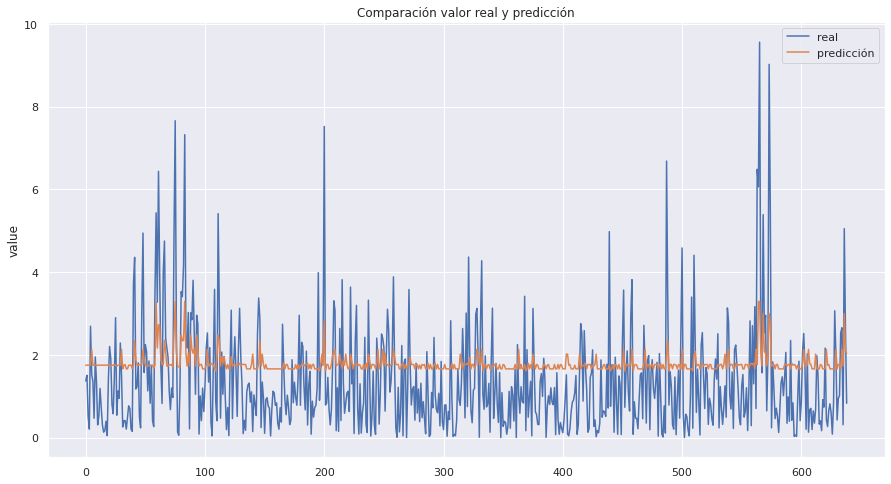

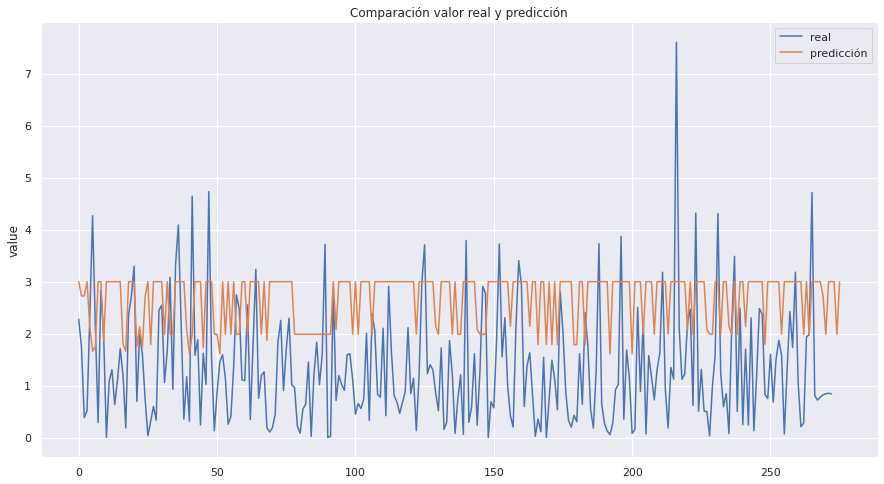

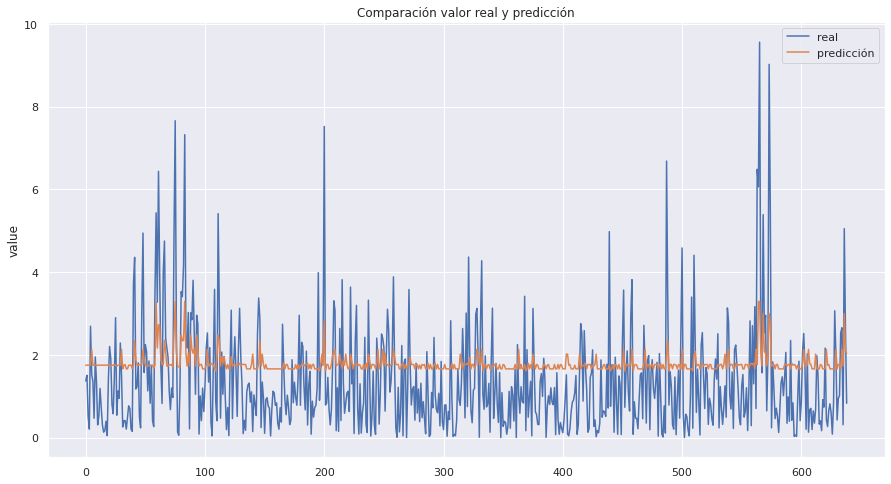

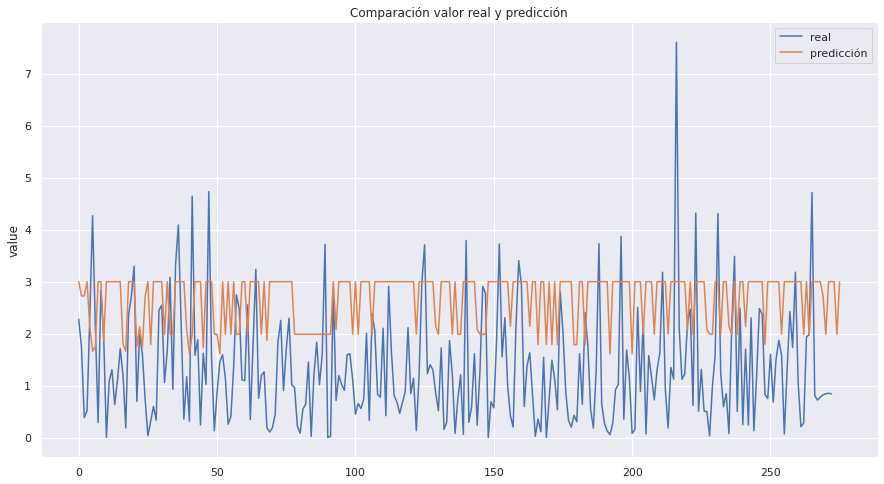

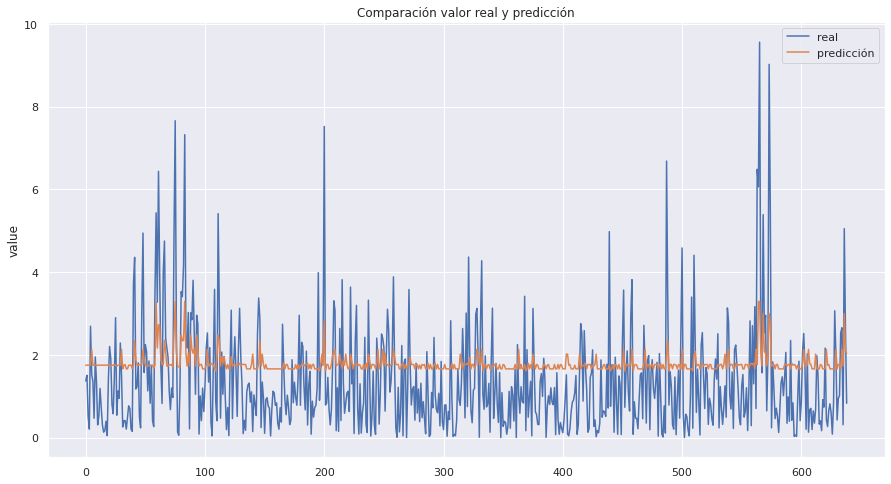

...

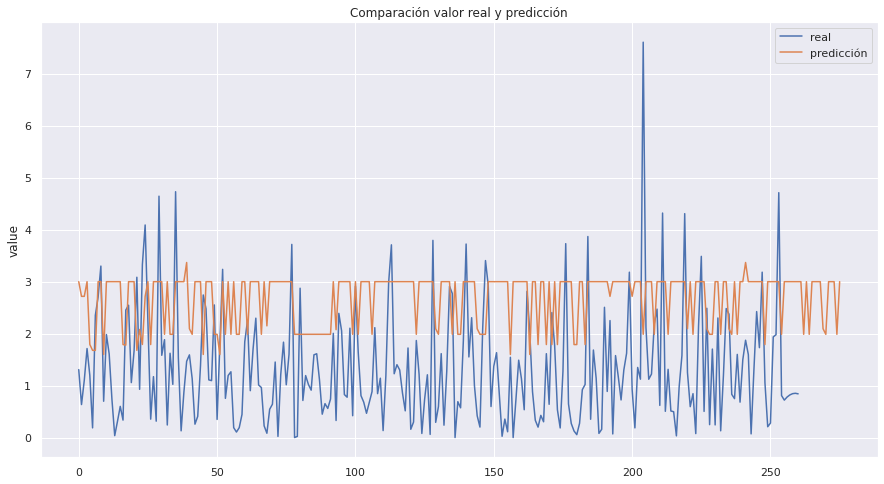

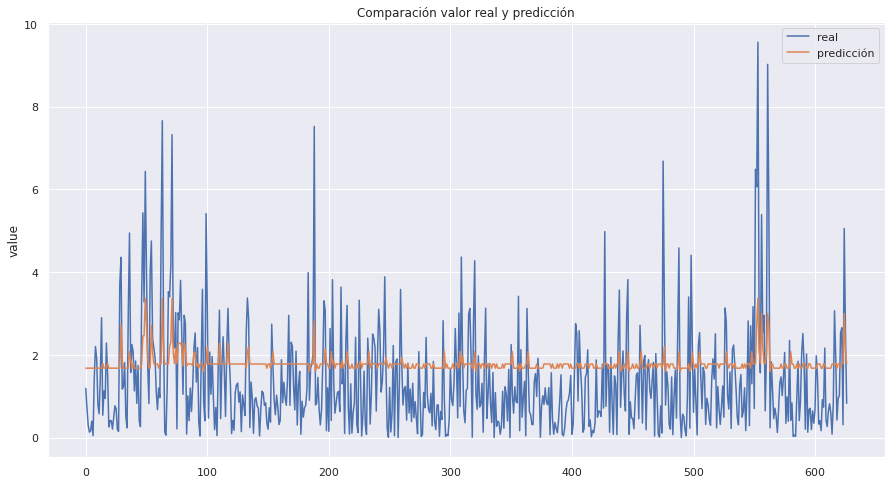

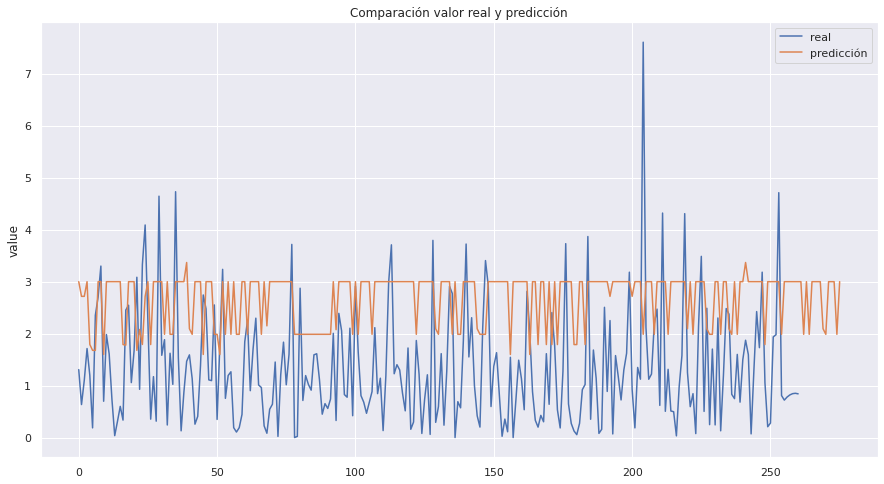

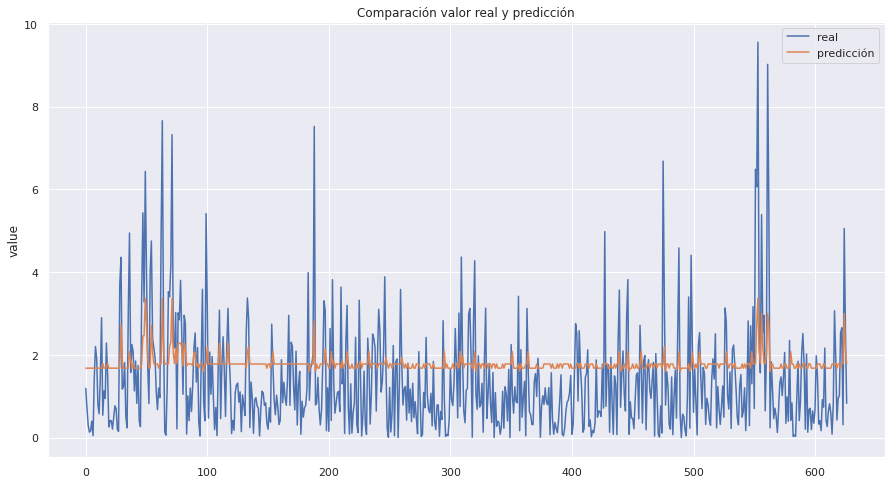

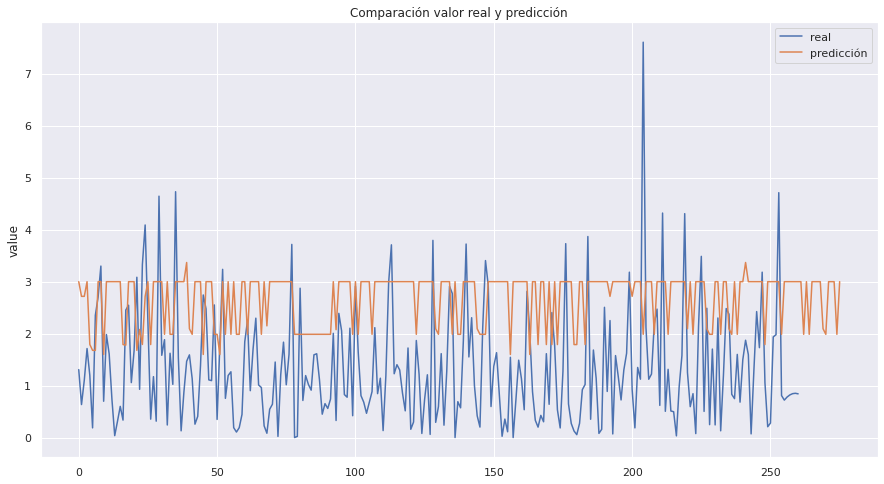

In [12]:
lags=[3,5,7,8,10,15]
n_estimators=[i for i in range(50,100,10)]
n_estimators.extend([200,300,500])
results_models={i:{} for i in lags}
for lg in lags:
    for est in n_estimators:
        results_models[lg][est]=Model(df_data.copy(),df_label.copy(),lg,est)